In [1]:
# 필요한 패키지 설치

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
plt.rcParams['figure.dpi'] = 300

In [2]:
# 데이터 불러오기
# https://www.kaggle.com/datasets/deepakkumar1987/correlation
df = pd.read_csv("datasets/wine-quality.csv")

# 데이터 샘플 확인
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [4]:
# 산점도 행렬 시각화
sns.set(font_scale=1.1) ## 폰트 크기 설정
sns.set_style('ticks') ## 축 눈금 설정
sns.pairplot(df,
             diag_kind='kde' # 상관계수가 1이면 분포로 표시
            )
plt.show()

In [6]:
# 공분산 확인
df.select_dtypes(float).cov()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
fixed acidity,1.681560,0.047012,0.060971,-0.693045,0.013564,-6.524162,-24.162531,0.001786,-0.052524,0.057990,-0.147911
volatile acidity,0.047012,0.027109,-0.009043,-0.154122,0.002177,-1.032411,-3.861743,0.000134,0.006898,0.005526,-0.007509
citric acid,0.060971,-0.009043,0.021102,0.098498,0.000200,0.344101,1.602662,0.000042,-0.007675,0.001245,-0.001808
residual sugar,-0.693045,-0.154122,0.098498,22.639751,-0.021493,34.060547,133.334227,0.007884,-0.204174,-0.131562,-2.041388
chlorides,0.013564,0.002177,0.000200,-0.021493,0.001228,-0.121269,-0.553673,0.000038,0.000252,0.002061,-0.010735
free sulfur dioxide,-6.524162,-1.032411,0.344101,34.060547,-0.121269,315.041192,723.261972,0.001369,-0.414329,-0.497973,-3.807165
total sulfur dioxide,-24.162531,-3.861743,1.602662,133.334227,-0.553673,723.261972,3194.720039,0.005491,-2.159577,-2.316258,-17.914646
density,0.001786,0.000134,0.000042,0.007884,0.000038,0.001369,0.005491,0.000009,0.000006,0.000116,-0.002456
pH,-0.052524,0.006898,-0.007675,-0.204174,0.000252,-0.414329,-2.159577,0.000006,0.025840,0.004575,0.023203
sulphates,0.057990,0.005526,0.001245,-0.131562,0.002061,-0.497973,-2.316258,0.000116,0.004575,0.022146,-0.000579


In [9]:
# 피어슨 상관계수 확인
df.select_dtypes(float).corr(method='pearson')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
fixed acidity,1.000000,0.220172,0.323736,-0.112319,0.298421,-0.283317,-0.329747,0.459204,-0.251814,0.300380,-0.095603
volatile acidity,0.220172,1.000000,-0.378061,-0.196702,0.377167,-0.353230,-0.414928,0.271193,0.260660,0.225476,-0.038248
citric acid,0.323736,-0.378061,1.000000,0.142486,0.039315,0.133437,0.195218,0.096320,-0.328689,0.057613,-0.010433
residual sugar,-0.112319,-0.196702,0.142486,1.000000,-0.128902,0.403439,0.495820,0.552498,-0.267050,-0.185745,-0.359706
chlorides,0.298421,0.377167,0.039315,-0.128902,1.000000,-0.195042,-0.279580,0.362594,0.044806,0.395332,-0.256861
free sulfur dioxide,-0.283317,-0.353230,0.133437,0.403439,-0.195042,1.000000,0.720934,0.025717,-0.145191,-0.188489,-0.179838
total sulfur dioxide,-0.329747,-0.414928,0.195218,0.495820,-0.279580,0.720934,1.000000,0.032395,-0.237687,-0.275381,-0.265740
density,0.459204,0.271193,0.096320,0.552498,0.362594,0.025717,0.032395,1.000000,0.011920,0.259454,-0.686745
pH,-0.251814,0.260660,-0.328689,-0.267050,0.044806,-0.145191,-0.237687,0.011920,1.000000,0.191248,0.121002
sulphates,0.300380,0.225476,0.057613,-0.185745,0.395332,-0.188489,-0.275381,0.259454,0.191248,1.000000,-0.003261


<Axes: >

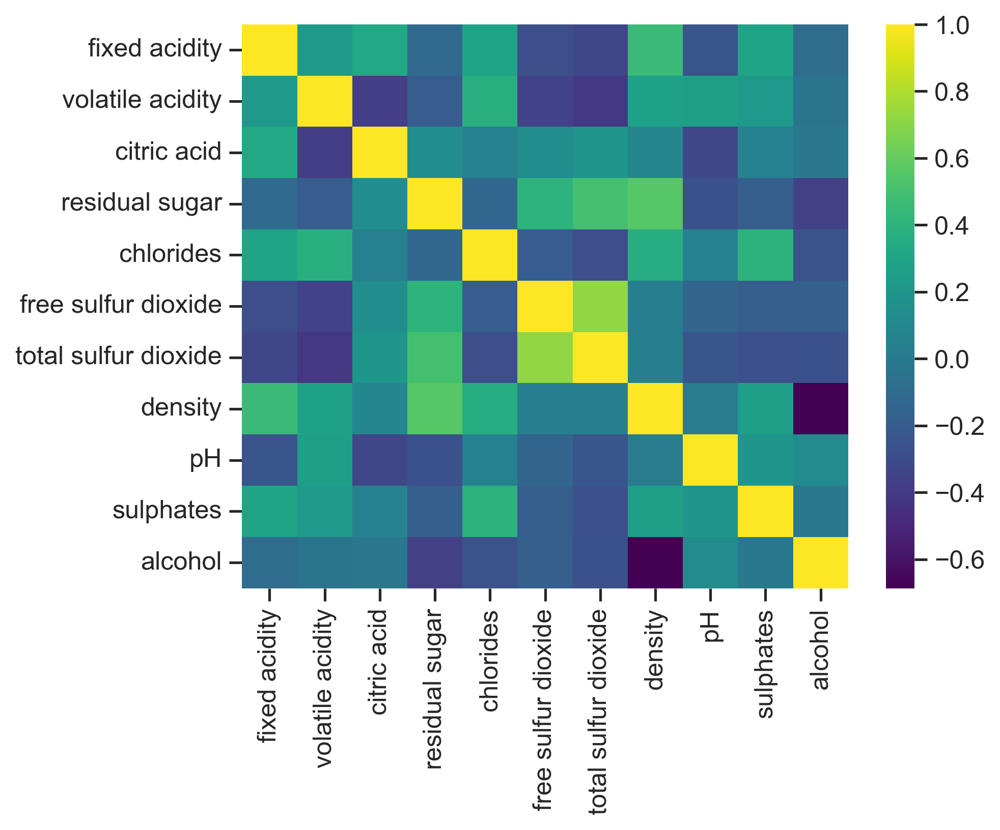

In [11]:
# 히트맵 시각화
sns.heatmap(df.select_dtypes(float).corr(), cmap='viridis')

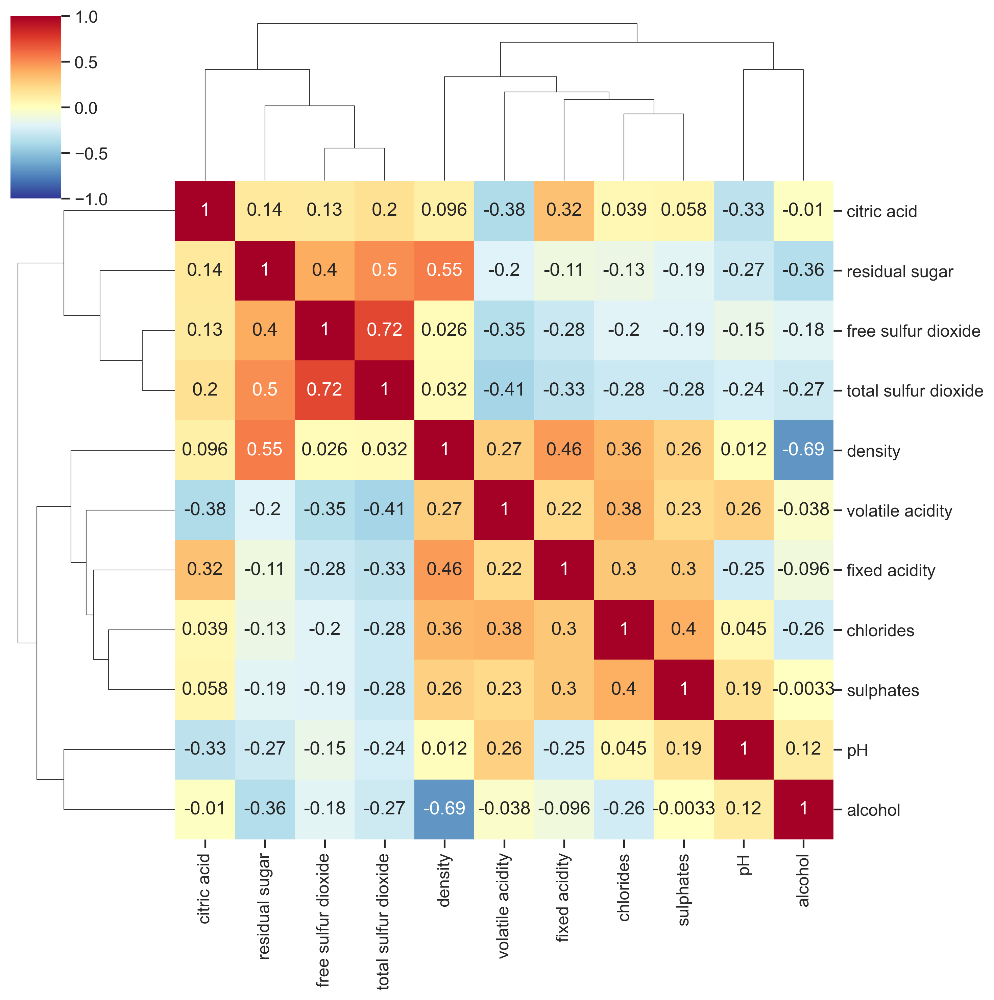

In [12]:
# clustermap 히트맵 시각화
sns.clustermap(df.select_dtypes(float).corr(), 
               annot = True,      
               cmap = 'RdYlBu_r',  
               vmin = -1, vmax = 1,
              )

Text(0.5, 1.0, 'Wine Quality Correlation')

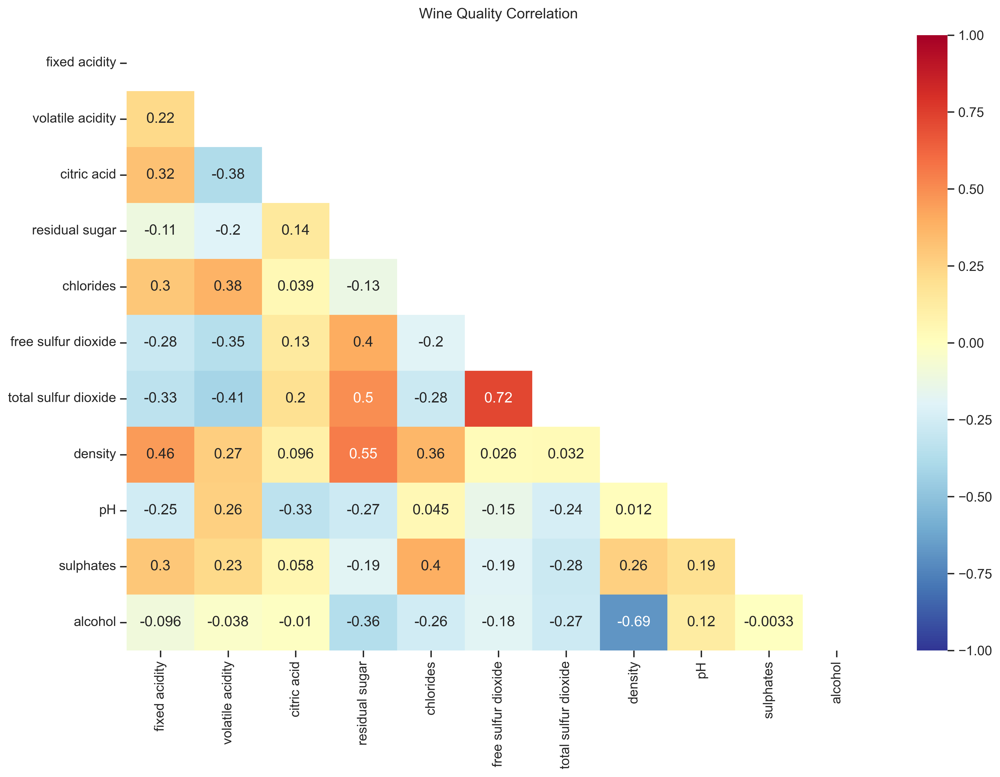

In [15]:
# 중복 제거 히트맵 시각화

# 매트릭스의 우측 상단을 모두 True인 1로, 하단을 False인 0으로 변환.
np.triu(np.ones_like(df.select_dtypes(float).corr()))

# True/False mask 배열로 변환.
mask = np.triu(np.ones_like(df.select_dtypes(float).corr(), dtype=np.bool))

#  히트맵 그래프 생성
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(df.select_dtypes(float).corr(), 
            mask=mask, 
            vmin=-1, 
            vmax = 1, 
            annot=True, 
            cmap="RdYlBu_r", 
            cbar = True)
ax.set_title('Wine Quality Correlation', pad = 15)